In [2]:
import xarray as xr
import proplot as plt
import numpy as np
import scipy.stats
import json
from sklearn.linear_model import LinearRegression

In [2]:
path = '/home/jupyter-haruki/work/processed/to_s3/'

indata = xr.open_dataset(path + 'compress.isosph5.CESM2.historical.r1i1p1f1.Input.Exp8_fixed.nc')
outdata = xr.open_dataset(path + 'compress.isosph5.CESM2.historical.r1i1p1f1.Output.nc')

In [3]:
testpath='../../../home/jupyter-haruki/work/processed/to_s3/compress.isosph5.CESM2.historical.r1i1p1f1.Input.Exp8_fixed.nc'
testpathout='../../../home/jupyter-haruki/work/processed/to_s3/compress.isosph5.CESM2.historical.r1i1p1f1.Output.nc'

indata=xr.open_dataset(testpath)
outdata=data1=xr.open_dataset(testpathout)




In [6]:
ncells = indata.ncells.shape[0]


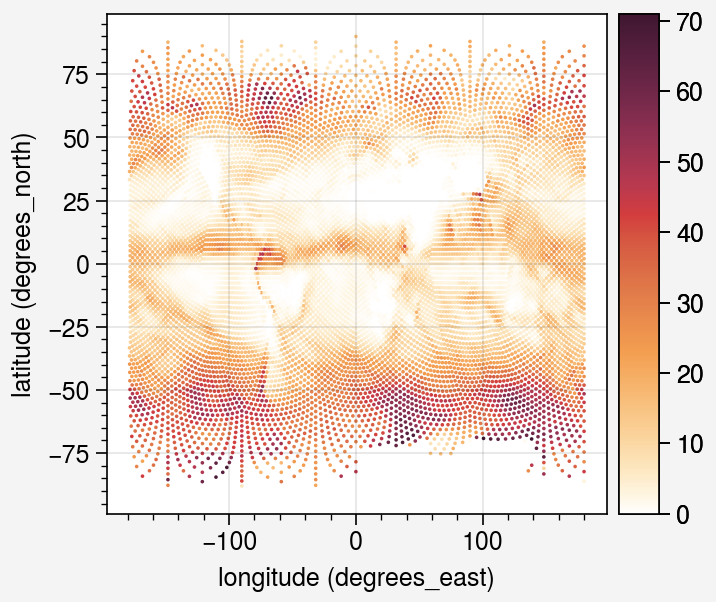

In [7]:
fig,ax=plt.subplots(1)

con = ax.scatter(indata.lon,indata.lat,c = indata.lcloud[6],s=0.5)
ax.colorbar(con)

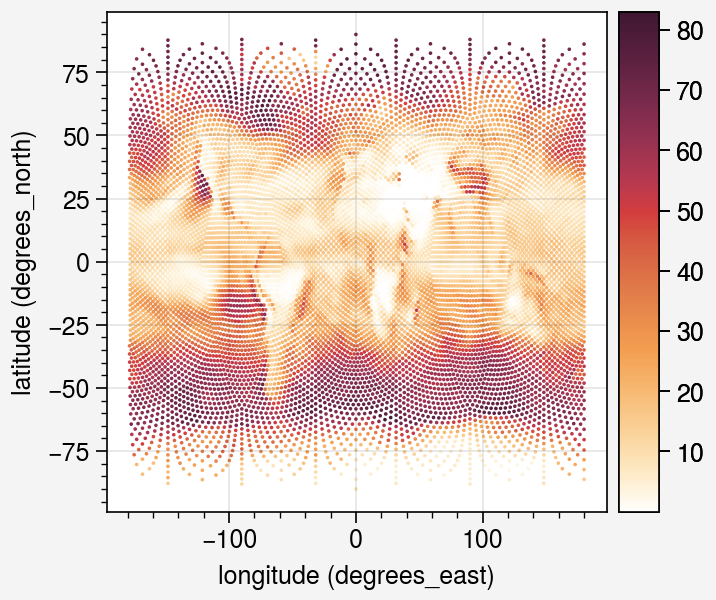

In [8]:
fig,ax=plt.subplots(1)

con = ax.scatter(indata.lon,indata.lat,c = indata.crelSurf[6],s=0.5)
ax.colorbar(con)

In [3]:
correls = {}
refvar = 'cres_pre'
mean_ref = np.mean(indata[refvar][:],axis=0)
anom_ref = (indata[refvar][:].T - mean_ref).T
for var in ['crel_pre','cresSurf_pre','crelSurf_pre','netTOAcs_pre','netSurfcs_pre']:
    print(var)
    mean_var = np.mean(indata[var][:],axis=0)
    anom_var = (indata[var][:].T - mean_var[:]).T
    correls[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))
for var in ['tas_pre','psl_pre','pr_pre']:
    print(var)
    mean_var = np.mean(outdata[var][:],axis=0)
    anom_var = (outdata[var][:].T - mean_var[:]).T
    correls[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))

crel_pre
cresSurf_pre
crelSurf_pre
netTOAcs_pre
netSurfcs_pre
tas_pre
psl_pre
pr_pre


In [6]:
indata['cres_pre'].values

(1980, 10242)

In [23]:
indata['cres_pre'].values[:10].shape

(10, 10242)

In [33]:
np.append(indata['cres_pre'].values[:],indata['crel_pre'].values[:],axis=0).shape

(1980, 20484)

In [36]:
ntime = indata['time'].shape[0]

In [39]:
def fit(a):
    #print(a.shape)
    return np.polyfit(a[:ntime],a[ntime:],1)
    
regress = np.apply_along_axis(fit,0,np.append(indata['cres_pre'].values[:],indata['crel_pre'].values[:],axis=0))

In [56]:
def fit(a):
    #print(a.shape)
    return np.polyfit(a[:ntime],a[ntime:],1)
    
regressions = {}
refvar = 'cres_pre'
for var in ['crel_pre','cresSurf_pre','crelSurf_pre','netTOAcs_pre','netSurfcs_pre']:
    print(var)
    regressions[var] = np.apply_along_axis(fit,0,np.append(indata[refvar].values[:],indata[var].values[:],axis=0))
for var in ['tas_pre','psl_pre','pr_pre']:
    print(var)
    regressions[var] = np.apply_along_axis(fit,0,np.append(indata[refvar].values[:],outdata[var].values[:],axis=0))


crel_pre
cresSurf_pre
crelSurf_pre
netTOAcs_pre
netSurfcs_pre
tas_pre
psl_pre
pr_pre


In [61]:
DS_reg =xr.Dataset({var:(('coeff','ncells'),regressions[var]) for var in regressions},
          coords = {'coeff':('coeff',[0,1]),
                   'ncells':('ncells',indata.ncells.values)}).to_netcdf('/home/jupyter-haruki/work/CESM2.cres_pre_regressions.nc')


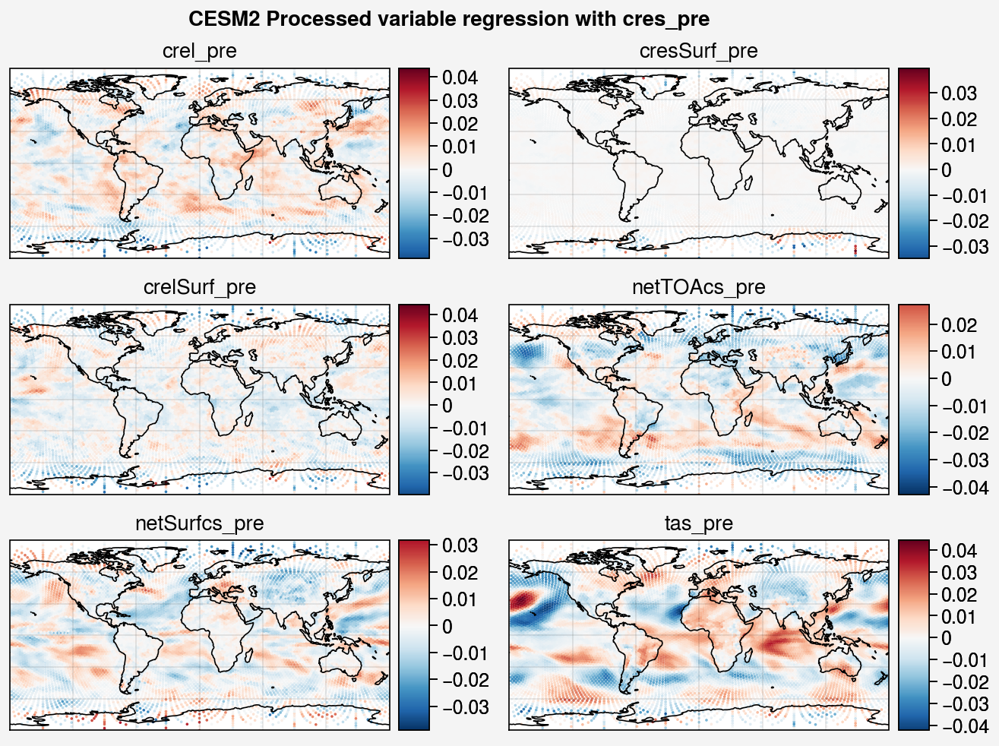

In [62]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='CESM2 Processed variable regression with cres_pre')

for i in range(6):
    var = list(regressions)[i]
    con = ax[i].scatter(indata['lon'],indata['lat'],c = regressions[var][1],s=0.5)
    ax[i].colorbar(con)
    ax[i].set_title(var)

In [45]:
xr.Dataset(correls).to_netcdf('/home/jupyter-haruki/work/CESM2.cres_pre_correlations.allmonths.nc')

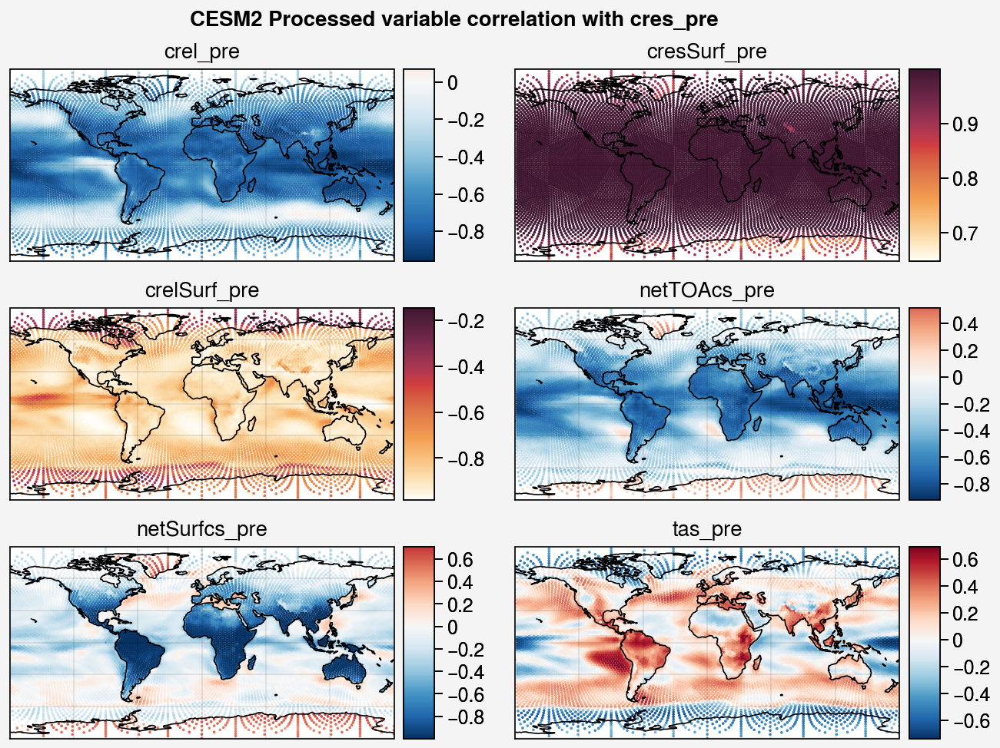

In [20]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='CESM2 Processed variable correlation with cres_pre')

for i in range(6):
    var = list(correls)[i]
    con = ax[i].scatter(indata['lon'],indata['lat'],c = correls[var],s=0.5)
    ax[i].colorbar(con)
    ax[i].set_title(var)

In [68]:
anom_ref

<xarray.DataArray 'cres_pre' (time: 1980, ncells: 10242)>
array([[ 0.2777318 , -0.01294255,  0.8888016 , ...,  0.26279223,
         0.41626316,  0.6992822 ],
       [-0.7237574 , -0.8232066 ,  0.552028  , ...,  0.5145203 ,
        -0.12589918,  0.56533533],
       [-0.5204175 ,  0.05331229,  0.71828747, ..., -0.22930779,
        -0.6528642 , -0.61994666],
       ...,
       [ 0.7669156 , -0.292631  , -0.3370674 , ..., -0.27362216,
        -0.7471198 , -0.7471185 ],
       [ 0.29606345, -0.7832087 ,  0.00497904, ...,  0.22432157,
         0.47729066,  0.05924873],
       [-0.07391019,  0.2288258 , -0.73803276, ...,  0.16901122,
         0.5762574 ,  0.48122582]], dtype=float32)
Coordinates:
  * time     (time) object 1850-01-15 12:00:00 ... 2014-12-15 12:00:00
    lon      (ncells) float64 -90.0 -90.0 90.0 90.0 ... -21.59 -25.66 -21.59
    lat      (ncells) float64 58.28 -58.28 58.28 -58.28 ... -1.184 1.184 1.184
  * ncells   (ncells) int64 0 1 2 3 4 5 ... 10236 10237 10238 10239 10240 10241

In [53]:
correls_lagged = {}
lags = np.arange(-12,12)

refvar = 'cres_pre'
mean_ref = np.mean(indata[refvar][:],axis=0)
anom_ref = (indata[refvar][:].T - mean_ref).T
for var in ['cres_pre','crel_pre','cresSurf_pre','crelSurf_pre','netTOAcs_pre','netSurfcs_pre']:
    print(var)
    mean_var = np.mean(indata[var][:],axis=0)
    anom_var = (indata[var][:].T - mean_var[:]).T
    correls_lagged[var] = np.zeros((len(lags),ncells))
    for i in lags:
        if i > 0:
            correls_lagged[var][i+12] = np.sum(anom_var.values[i:] * anom_ref.values[:-1*i],axis=0)/np.sqrt(np.sum(anom_var[i:]**2,axis=0) * np.sum(anom_ref[:-1*i]**2,axis=0))
        elif i < 0:
            correls_lagged[var][i+12] = np.sum(anom_var.values[:i] * anom_ref.values[-i:],axis=0)/np.sqrt(np.sum(anom_var[:i]**2,axis=0) * np.sum(anom_ref[-i:]**2,axis=0))
        else:
            correls_lagged[var][i+12] = np.sum(anom_var.values[:] * anom_ref.values[:],axis=0)/np.sqrt(np.sum(anom_var[:]**2,axis=0) * np.sum(anom_ref[:]**2,axis=0))

for var in ['tas_pre','psl_pre','pr_pre']:
    print(var)
    mean_var = np.mean(outdata[var][:],axis=0)
    anom_var = (outdata[var][:].T - mean_var[:]).T
    correls_lagged[var] = np.zeros((len(lags),ncells))
    for i in lags:
        if i > 0:
            correls_lagged[var][i+12] = np.sum(anom_var.values[i:] * anom_ref.values[:-1*i],axis=0)/np.sqrt(np.sum(anom_var[i:]**2,axis=0) * np.sum(anom_ref[:-1*i]**2,axis=0))
        elif i < 0:
            correls_lagged[var][i+12] = np.sum(anom_var.values[:i] * anom_ref.values[-i:],axis=0)/np.sqrt(np.sum(anom_var[:i]**2,axis=0) * np.sum(anom_ref[-i:]**2,axis=0))
        else:
            correls_lagged[var][i+12] = np.sum(anom_var.values[:] * anom_ref.values[:],axis=0)/np.sqrt(np.sum(anom_var[:]**2,axis=0) * np.sum(anom_ref[:]**2,axis=0))


cres_pre
crel_pre
cresSurf_pre
crelSurf_pre
netTOAcs_pre
netSurfcs_pre
tas_pre
psl_pre
pr_pre


In [55]:
xr.Dataset({var:(('lag','ncells'),correls_lagged[var]) for var in correls_lagged},
          coords = {'lag':('lag',lags)}).to_netcdf('/home/jupyter-haruki/work/CESM2.cres_pre_correlations.lagged.nc')


Text(0.5, 1.0, 'pr_pre 58.28N -90.00E')

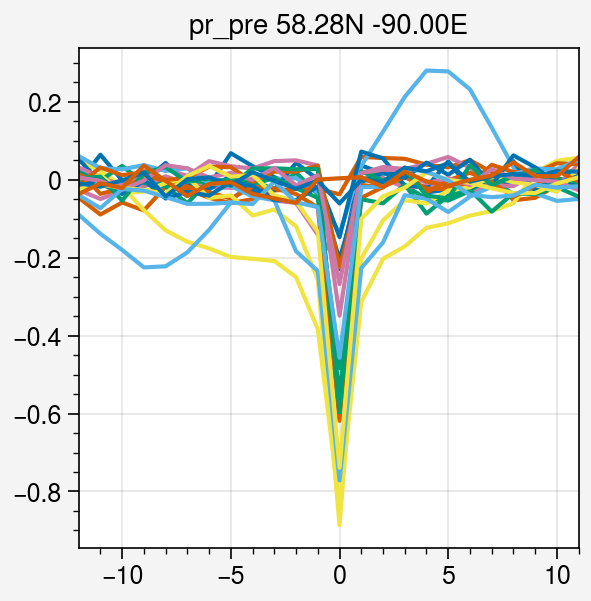

In [116]:
fig,ax = plt.subplots(1)

x= 0
var = 'pr_pre'
ax.plot(lags,correls_lagged[var][:,:20])
ax.set_title('{2} {0:3.2f}N {1:3.2f}E'.format(outdata['lat'][x].values,outdata['lon'][x].values,var))

Text(0.5, 0, 'cres_pre leads  <------> tas_pre leads')

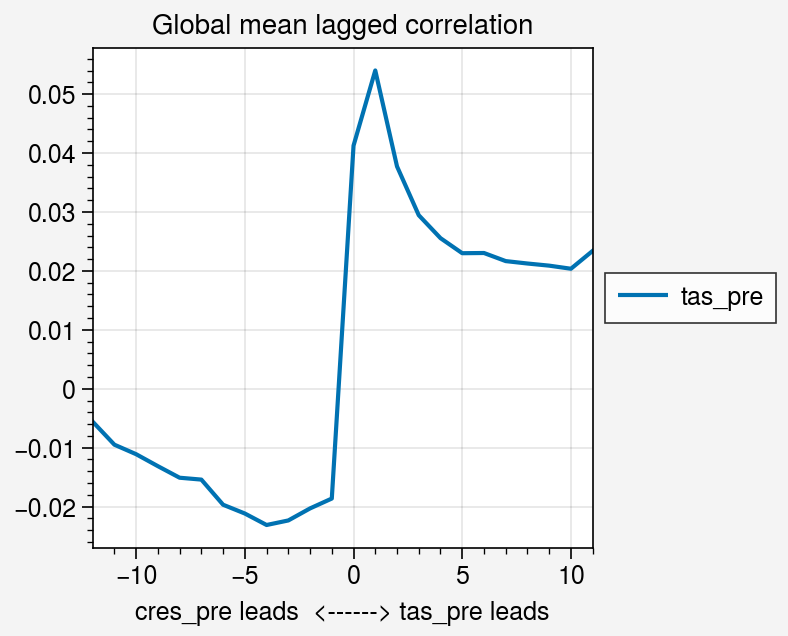

In [132]:
fig,ax = plt.subplots(1)

x= 0
#var = 'pr_pre'
#ax.plot(lags,np.mean(correls_lagged[var][:],axis=1),label = var)

var = 'tas_pre'
ax.plot(lags,np.mean(correls_lagged[var][:],axis=1),label = var)

#var = 'netTOAcs_pre'
#ax.plot(lags,np.mean(correls_lagged[var][:],axis=1),label = var)

ax.legend(loc='r',ncol=1)
ax.set_title('Global mean lagged correlation')
ax.set_xlabel('cres_pre leads  <------> tas_pre leads')

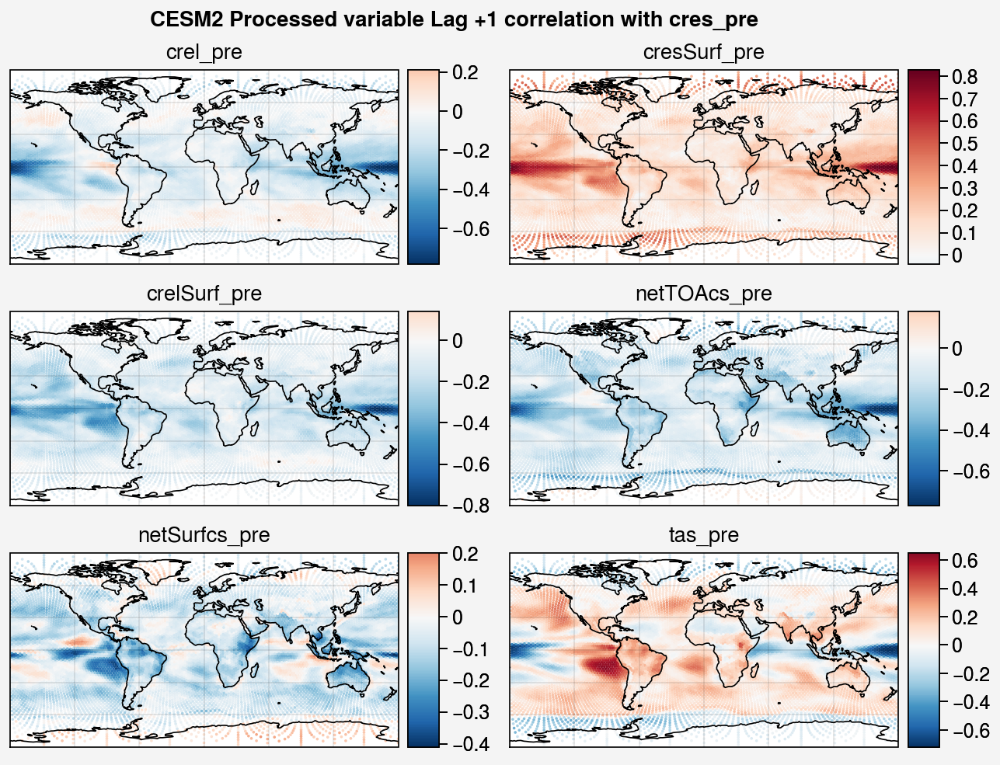

In [126]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='CESM2 Processed variable Lag +1 correlation with cres_pre')

for i in range(6):
    var = list(correls)[i]
    con = ax[i].scatter(indata['lon'],indata['lat'],c = correls_lagged[var][13],s=0.5)
    ax[i].colorbar(con)
    ax[i].set_title(var)

In [47]:
ncell = indata.ncells.shape[0]

In [50]:
correls_monthly = {}
refvar = 'cres_pre'
mean_ref = [np.mean(indata[refvar][m::12],axis=0) for m in range(12)] 
anom_ref = [(indata[refvar][m::12].T - mean_ref[m]).T for m in range(12)]
for var in ['crel_pre','cresSurf_pre','crelSurf_pre','netTOAcs_pre','netSurfcs_pre']:
    correls_monthly[var] = np.zeros((12,ncell))
    print(var)
    for m in range(12):
        mean_var = np.mean(indata[var][m::12],axis=0)
        anom_var = (indata[var][m::12].T - mean_var).T
        correls_monthly[var][m] = np.sum(anom_var * anom_ref[m],axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref[m]**2,axis=0))
for var in ['tas_pre','psl_pre','pr_pre']:
    correls_monthly[var] = np.zeros((12,ncell))
    print(var)
    for m in range(12):
        mean_var = np.mean(outdata[var][m::12],axis=0)
        anom_var = (outdata[var][m::12].T - mean_var).T
        correls_monthly[var][m] = np.sum(anom_var * anom_ref[m],axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref[m]**2,axis=0))

crel_pre
cresSurf_pre
crelSurf_pre
netTOAcs_pre
netSurfcs_pre
tas_pre
psl_pre
pr_pre


In [55]:
xr.Dataset({var:(('mon','ncells'),correls_monthly[var]) for var in correls_monthly}).to_netcdf('/home/jupyter-haruki/work/CESM2.cres_pre_correlations.monthly.nc')

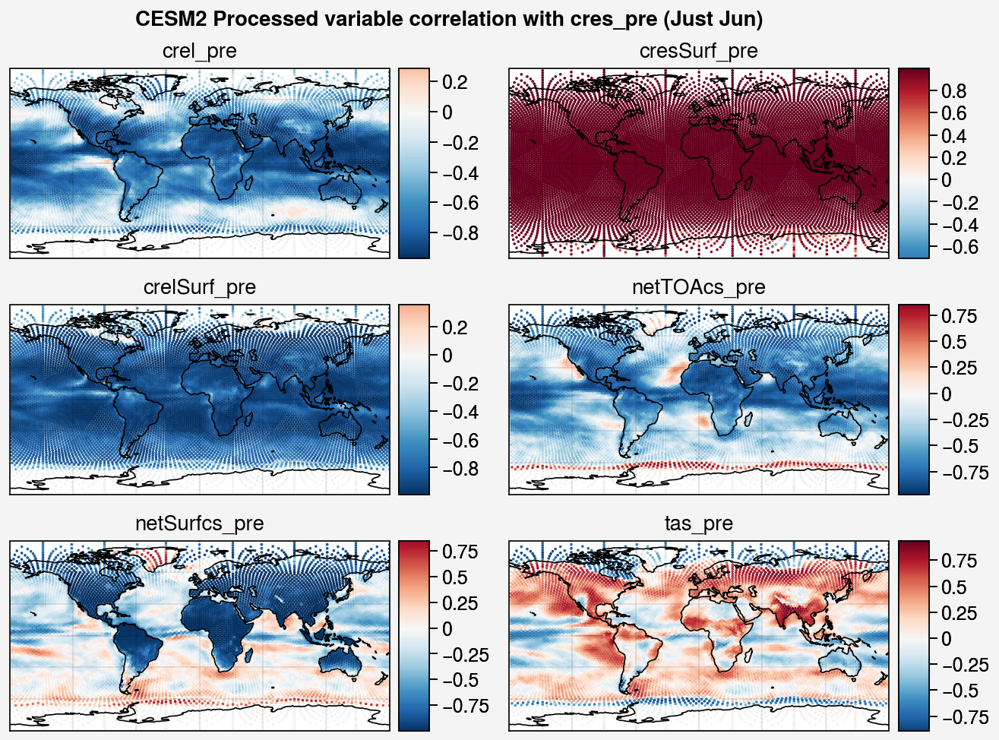

In [52]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='CESM2 Processed variable correlation with cres_pre (Just Jun)')

for i in range(6):
    var = list(correls)[i]
    con = ax[i].scatter(indata['lon'],indata['lat'],c = correls_monthly[var][5],s=0.5)
    ax[i].colorbar(con)
    ax[i].set_title(var)

In [26]:
correls_jul = {}
refvar = 'cres_pre'
mean_ref = np.mean(indata[refvar][6::12],axis=0)
anom_ref = (indata[refvar][6::12].T - mean_ref).T
for var in ['crel_pre','cresSurf_pre','crelSurf_pre','netTOAcs_pre','netSurfcs_pre']:
    print(var)
    mean_var = np.mean(indata[var][6::12],axis=0)
    anom_var = (indata[var][6::12].T - mean_var).T
    correls_jul[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))
for var in ['tas_pre','psl_pre','pr_pre']:
    print(var)
    mean_var = np.mean(outdata[var][6::12],axis=0)
    anom_var = (outdata[var][6::12].T - mean_var).T
    correls_jul[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))

crel_pre
cresSurf_pre
crelSurf_pre
netTOAcs_pre
netSurfcs_pre
tas_pre
psl_pre
pr_pre


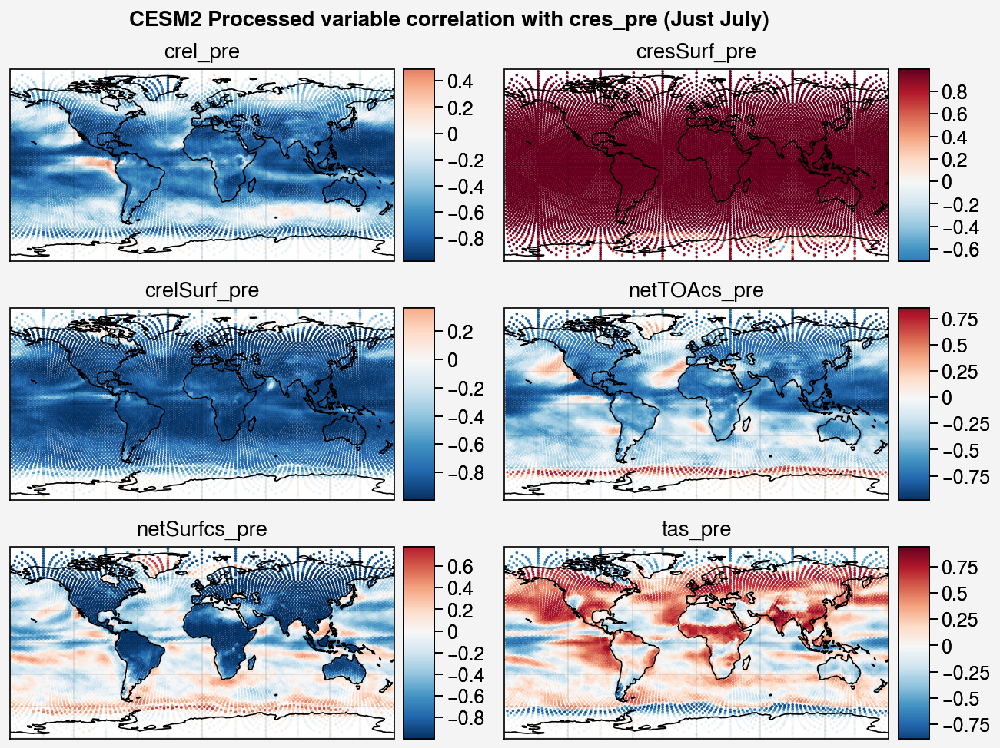

In [28]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='CESM2 Processed variable correlation with cres_pre (Just July)')

for i in range(6):
    var = list(correls)[i]
    con = ax[i].scatter(indata['lon'],indata['lat'],c = correls_jul[var],s=0.5)
    ax[i].colorbar(con)
    ax[i].set_title(var)

In [32]:
correls_raw = {}
refvar = 'cres'
mean_ref = np.mean(indata[refvar][:],axis=0)
anom_ref = (indata[refvar][:].T - mean_ref).T
for var in ['crel','cresSurf','crelSurf','netTOAcs','netSurfcs']:
    print(var)
    mean_var = np.mean(indata[var][:],axis=0)
    anom_var = (indata[var][:].T - mean_var).T
    correls_raw[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))
for var in ['tas','psl','pr']:
    print(var)
    mean_var = np.mean(outdata[var][:],axis=0)
    anom_var = (outdata[var][:].T - mean_var).T
    correls_raw[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))

crel
cresSurf
crelSurf
netTOAcs
netSurfcs
tas
psl
pr


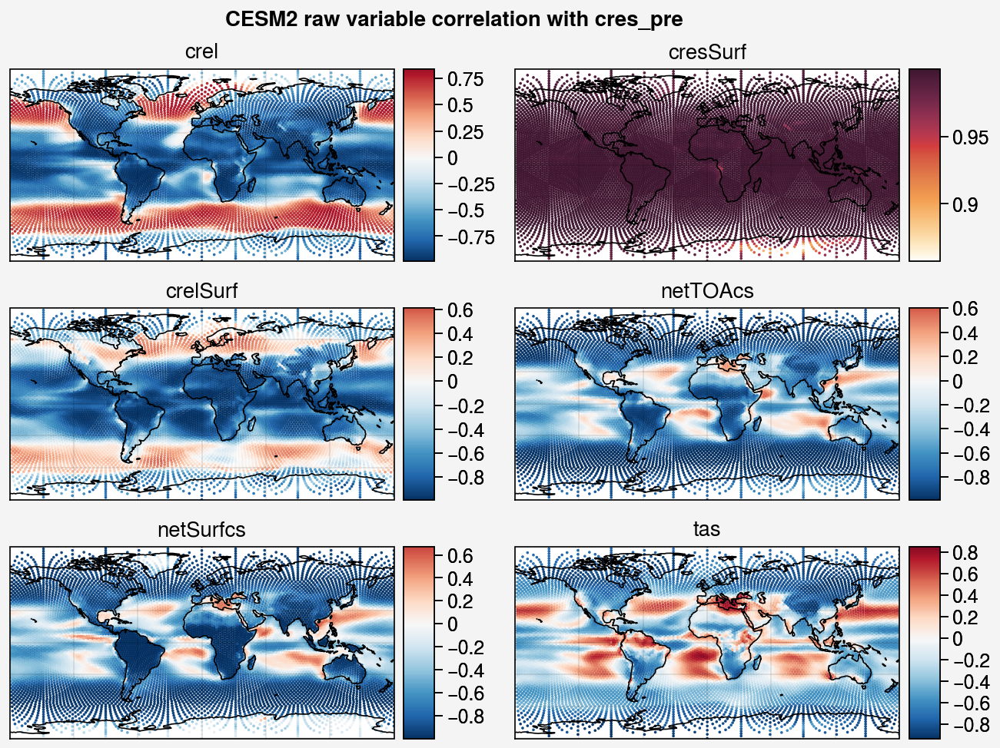

In [34]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='CESM2 raw variable correlation with cres_pre')

for i in range(6):
    var = list(correls_raw)[i]
    con = ax[i].scatter(indata['lon'],indata['lat'],c = correls_raw[var],s=0.5)
    ax[i].colorbar(con)
    ax[i].set_title(var)

In [37]:
correls_raw = {}
refvar = 'cres'
mean_ref = np.mean(indata[refvar][6::12],axis=0)
anom_ref = (indata[refvar][6::12].T - mean_ref).T
for var in ['crel','cresSurf','crelSurf','netTOAcs','netSurfcs']:
    print(var)
    mean_var = np.mean(indata[var][6::12],axis=0)
    anom_var = (indata[var][6::12].T - mean_var).T
    correls_raw[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))
for var in ['tas','psl','pr']:
    print(var)
    mean_var = np.mean(outdata[var][6::12],axis=0)
    anom_var = (outdata[var][6::12].T - mean_var).T
    correls_raw[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))

crel
cresSurf
crelSurf
netTOAcs
netSurfcs
tas
psl
pr


In [ ]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='CESM2 raw variable correlation with cres_pre (just Jul)')

for i in range(6):
    var = list(correls_raw)[i]
    con = ax[i].scatter(indata['lon'],indata['lat'],c = correls_raw[var],s=0.5)
    ax[i].colorbar(con)
    ax[i].set_title(var)

# F2000 correlations

In [22]:
exp_info

{'Fixed_SST': {'base_compset': 'F2000climo',
  'description': 'Y2000 fixed SST control',
  'perturbed_regions': 'none',
  'cdnc_pert_type': 'none',
  'cdnc_pert_version': 'none',
  'nyears': 19,
  'last_updated': 'May 29, 2022',
  'notes': 'none'},
 'MCB_R1R2R3_CN375cm': {'base_compset': 'F2000climo',
  'description': 'Y2000 fixed SST, NEPac,SEPac,SEAtl perturbed to 375cm-3',
  'perturbed_regions': 'R1R2R3',
  'cdnc_pert_type': 'Fixed',
  'cdnc_pert_version': '1.0',
  'cdnc_level': {'R1': 375, 'R2': 375, 'R3': 375},
  'nyears': 10,
  'last_updated': 'May 27, 2022',
  'notes': 'none'},
 'MCB_R1R2R3_CN475cm': {'base_compset': 'F2000climo',
  'description': 'Y2000 fixed SST, NEPac,SEPac,SEAtl perturbed to 475cm-3',
  'perturbed_regions': 'R1R2R3',
  'cdnc_pert_type': 'Fixed',
  'cdnc_pert_version': '1.0',
  'cdnc_level': {'R1': 475, 'R2': 475, 'R3': 475},
  'nyears': 10,
  'last_updated': 'May 27, 2022',
  'notes': 'none'},
 'MCB_R1R2R3_CN575cm': {'base_compset': 'F2000climo',
  'descript

In [3]:
path = '/home/jupyter-haruki/work/CESM_MCB/'
exp_info = json.load(open('/home/jupyter-haruki/scripts/mcb_experiments.json'))

data = {}
for exp in exp_info:
    data[exp] = xr.open_mfdataset([path + '{1}/{1}.cam.h0.{0}.y1-{2}.nc'.format(var,exp,exp_info[exp]['nyears'])
                           for var in ['TREFHT','crel','cres','crelSurf','cresSurf',
                                       'netSurfcs','netTOAcs','PSL','PRECC','PRECL']],decode_times=False)

In [4]:
lons,lats = np.meshgrid(data['Fixed_SST'].lon,data['Fixed_SST'].lat)

In [5]:
correls_raw = {}
refvar = 'cres'
mean_ref = np.mean(data['Fixed_SST'][refvar][:],axis=0)
anom_ref = (data['Fixed_SST'][refvar][:].T - mean_ref).T
for var in ['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT','PSL','PRECC','cres',]:
    print(var)
    mean_var = np.mean(data['Fixed_SST'][var][:],axis=0)
    anom_var = (data['Fixed_SST'][var][:].T - mean_var).T
    correls_raw[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))

crel
cresSurf
crelSurf
netTOAcs
netSurfcs
TREFHT
PSL
PRECC
cres


In [ ]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='F2000 raw variable correlation with cres')

for i in range(6):
    var = list(correls_raw)[i]
    con = ax[i].contourf(lons,lats,correls_raw[var])
    ax[i].colorbar(con)
    ax[i].set_title(var)


In [10]:
d_mean = {}
for exp in exp_info:
    d_mean[exp] = data[exp].mean('time')

In [13]:
correls_pert = {}
ref_var = 'cres'
mean_ref = np.mean([d_mean[exp][ref_var][:] for exp in d_mean],axis=0)
anom_ref = np.array([d_mean[exp][ref_var][:] for exp in d_mean]) - mean_ref
for var in ['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT','PSL','PRECC','cres',]:
    print(var)
    mean_var = np.mean([d_mean[exp][var][:] for exp in d_mean],axis=0)
    anom_var = np.array([d_mean[exp][var][:] for exp in d_mean]) - mean_var
    correls_pert[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))

crel
cresSurf
crelSurf
netTOAcs
netSurfcs
TREFHT
PSL
PRECC


/tmp/ipykernel_2470534/134047074.py:9: RuntimeWarning: divide by zero encountered in true_divide
  correls_pert[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))
/tmp/ipykernel_2470534/134047074.py:9: RuntimeWarning: invalid value encountered in true_divide
  correls_pert[var] = np.sum(anom_var * anom_ref,axis=0)/np.sqrt(np.sum(anom_var**2,axis=0) * np.sum(anom_ref**2,axis=0))


cres


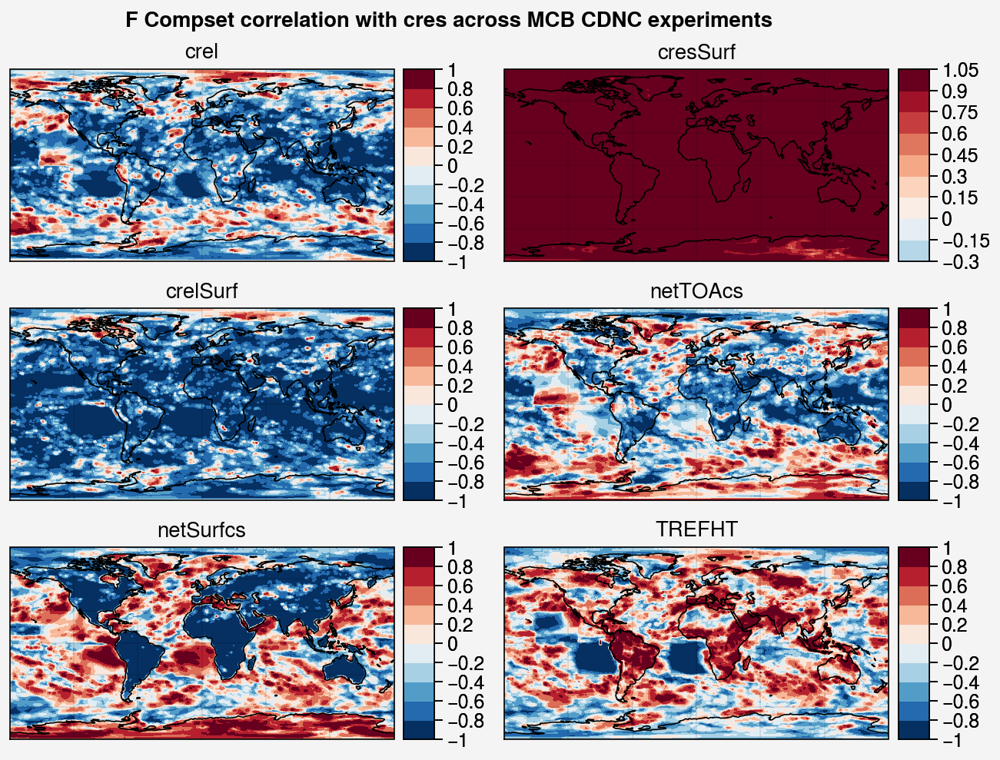

In [17]:
fig,ax = plt.subplots(ncols=2,nrows=3,proj='cyl')
fig.format(coast=True,suptitle='F Compset correlation with cres across MCB CDNC experiments')

for i in range(6):
    var = list(correls_raw)[i]
    con = ax[i].contourf(lons,lats,correls_pert[var])
    ax[i].colorbar(con)
    ax[i].set_title(var)


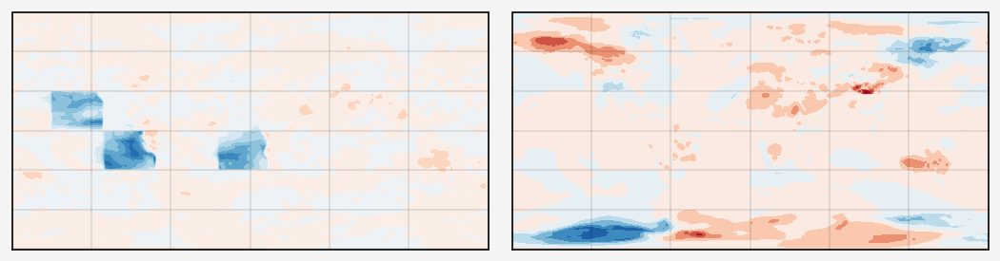

In [21]:
fig,ax = plt.subplots(ncols=2,nrows=1,proj='cyl')
con = ax[0].contourf(lons,lats,d_mean['MCB_R1R2R3_CN375cm']['cres'] - d_mean['Fixed_SST']['cres'])

con = ax[1].contourf(lons,lats,d_mean['MCB_R1R2R3_CN375cm']['TREFHT'] - d_mean['Fixed_SST']['TREFHT'])

In [22]:
d_regions = {'NEP':[-150,-110,0,30],
            'SEP':[-110,-70,-30,0],
            'SEA':[-15,25,-30,0]}

In [6]:
lat = data['Fixed_SST'].lat
lon = data['Fixed_SST'].lon

In [7]:
regmeans = {}
regmeans['NEP'] = {exp:data[exp].where((lat > 0) & (lat < 30) & 
                                          (lon > 360-150)&(lon < 360-110),
                                          drop=True).mean(('lon','lat')) for exp in data}
regmeans['SEP'] = {exp:data[exp].where((lat > -30) & (lat < 0) & 
                                          (lon > 360-110) & (lon < 360-70),
                                          drop=True).mean(('lon','lat')) for exp in data}
regmeans['SEA'] = {exp:data[exp].where((lat > -30) & (lat < 0) & 
                                          ((lon > 360-15) | (lon < 25)),
                                          drop=True).mean(('lon','lat')) for exp in data}


In [50]:
regmeans['NEP']['MCB_R1R2R3_CN375cm']['cres'].mean().values - regmeans['NEP']['Fixed_SST']['cres'].mean().values

-13.387482

In [53]:
data.keys()

dict_keys(['Fixed_SST', 'MCB_R1R2R3_CN375cm', 'MCB_R1R2R3_CN475cm', 'MCB_R1R2R3_CN575cm', 'MCB_R1R2R3_CN600cm', 'MCB_R1R2R3_CN675cm', 'MCB_R1R2R3_CN775cm'])

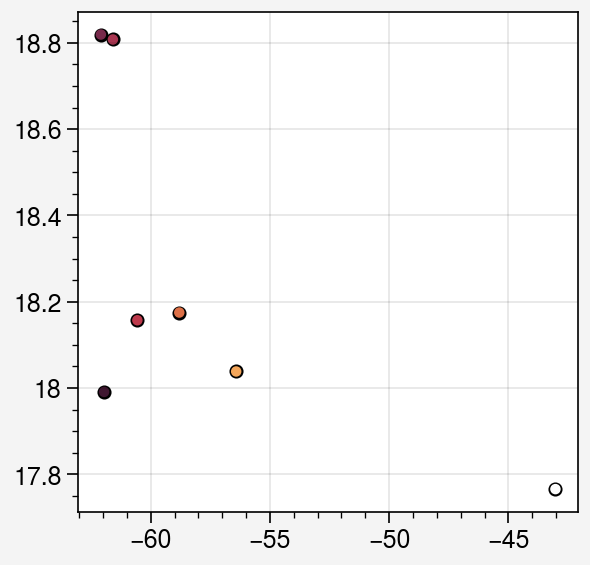

In [60]:
fig,ax = plt.subplots(1)
reg = 'NEP'
ax.scatter([np.mean(regmeans[reg][exp]['cres']) for exp in data],
           [np.mean(regmeans[reg][exp]['crel']) for exp in data],
           s = 20,
           c = 'k')
ax.scatter([np.mean(regmeans[reg][exp]['cres']) for exp in data],
           [np.mean(regmeans[reg][exp]['crel']) for exp in data],
           s = 10,
          c = [200,375,475,575,600,675,775])

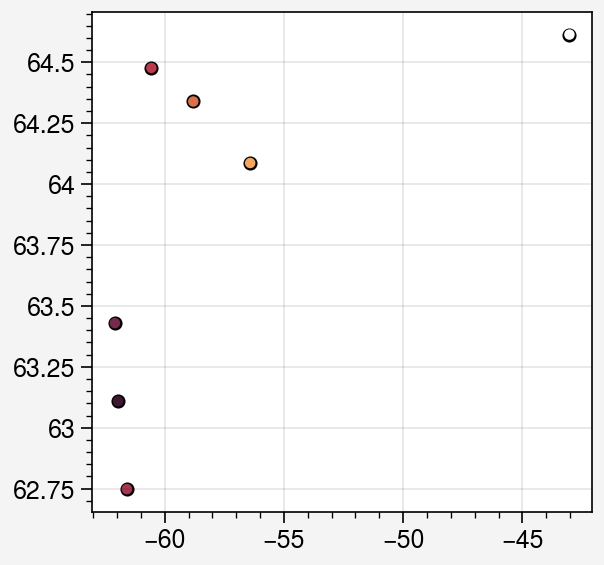

In [61]:
fig,ax = plt.subplots(1)
reg = 'NEP'
ax.scatter([np.mean(regmeans[reg][exp]['cres']) for exp in data],
           [np.mean(regmeans[reg][exp]['netSurfcs']) for exp in data],
           s = 20,
           c = 'k')
ax.scatter([np.mean(regmeans[reg][exp]['cres']) for exp in data],
           [np.mean(regmeans[reg][exp]['netSurfcs']) for exp in data],
           s = 10,
          c = [200,375,475,575,600,675,775])

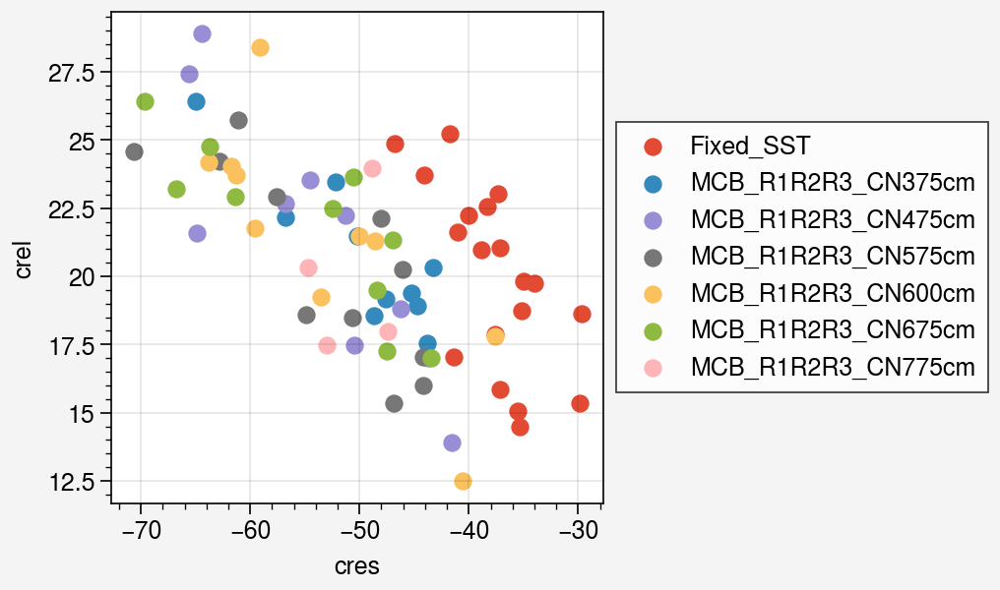

In [88]:
plt.rc.cycle = 'ggplot'

fig,ax = plt.subplots(1)
reg = 'NEP'

for exp in data:
    ax.scatter(regmeans[reg][exp]['cres'][::12],
               regmeans[reg][exp]['crel'][::12],
               label=exp)
ax.legend(loc='r',ncol=1)

In [97]:
exp

'MCB_R1R2R3_CN775cm'

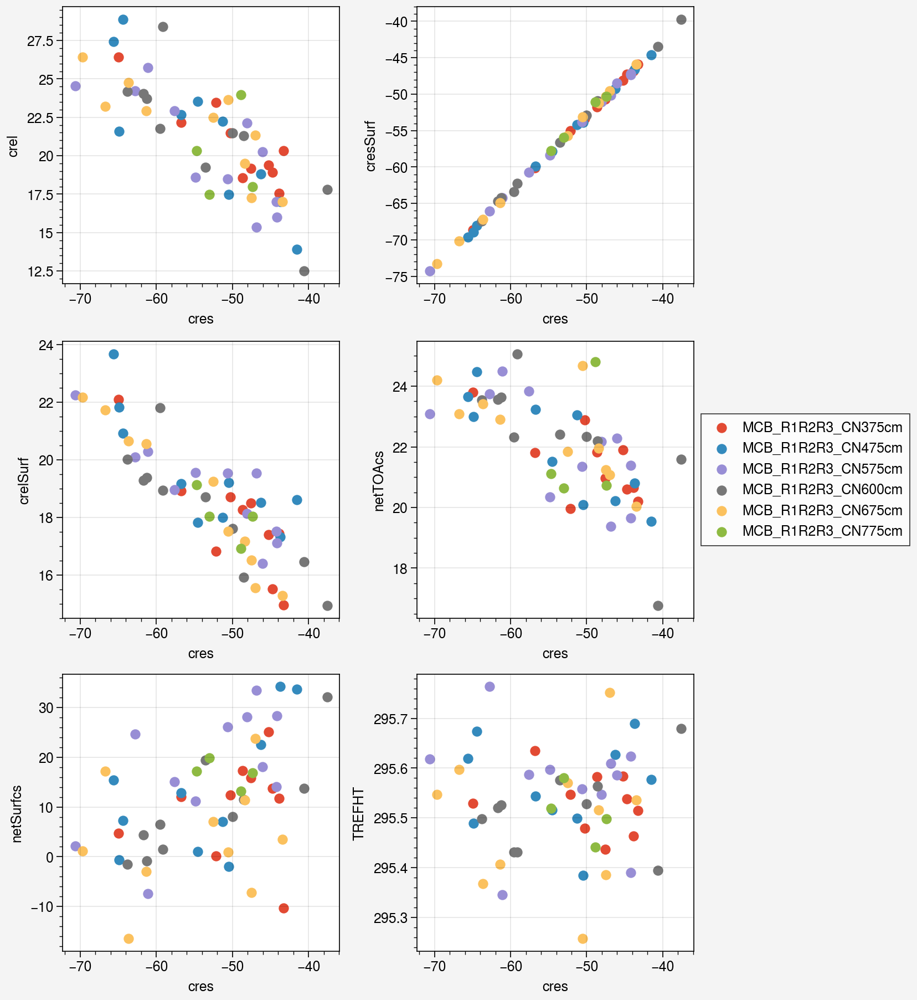

In [101]:
plt.rc.cycle = 'ggplot'

fig,ax = plt.subplots(ncols = 2,nrows = 3,share=False)
reg = 'NEP'

for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT']):
    for exp in data:
        if not exp == 'Fixed_SST':
            ax[i].scatter(regmeans[reg][exp]['cres'][::12],
                   regmeans[reg][exp][var][::12],label=exp)
ax[3].legend(loc='r',ncol=1)

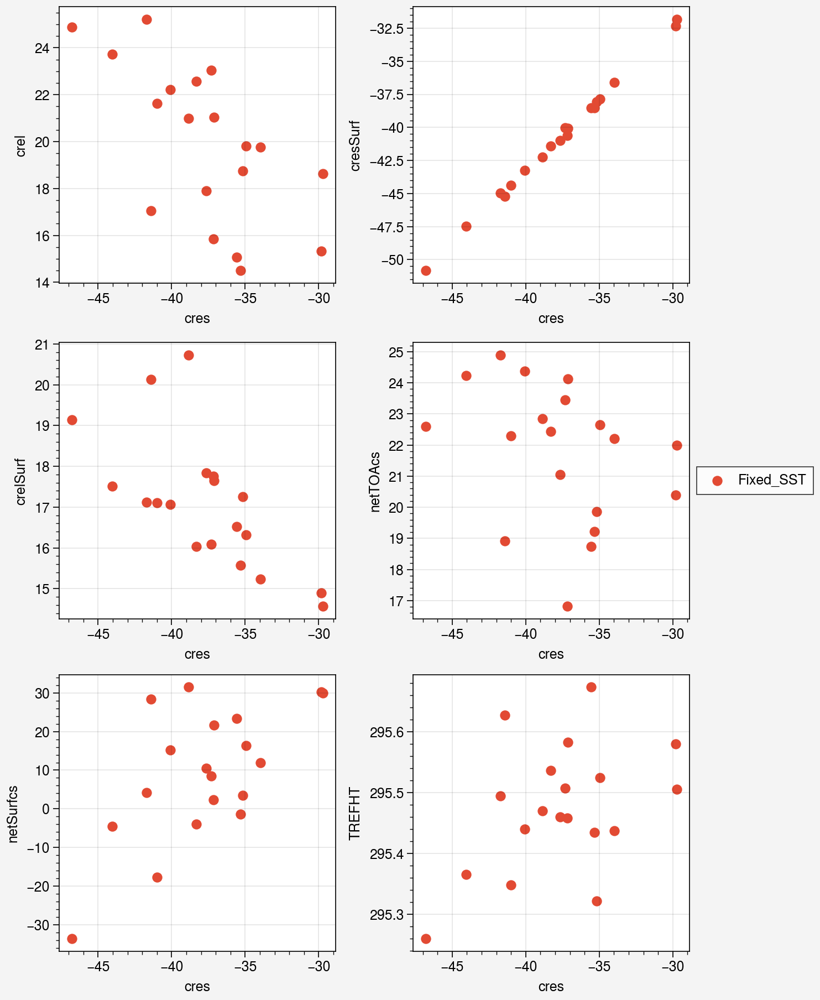

In [102]:
plt.rc.cycle = 'ggplot'

fig,ax = plt.subplots(ncols = 2,nrows = 3,share=False)
reg = 'NEP'

for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT']):
    for exp in data:
        if exp == 'Fixed_SST':
            ax[i].scatter(regmeans[reg][exp]['cres'][::12],
                   regmeans[reg][exp][var][::12],label=exp)
ax[3].legend(loc='r',ncol=1)

In [148]:
## Fixed_SST regressions
regress = {}
exp = 'Fixed_SST'

for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT']):
        regress[var] = []
        for j,reg in enumerate(['NEP','SEP','SEA']):
            print(var,reg)
            regress[var].append([])
            for m in range(12):
                regress[var][j].append(np.array(scipy.stats.linregress(regmeans[reg][exp]['cres'][m::12],regmeans[reg][exp][var][m::12])))


crel NEP
crel SEP
crel SEA
cresSurf NEP
cresSurf SEP
cresSurf SEA
crelSurf NEP
crelSurf SEP
crelSurf SEA
netTOAcs NEP
netTOAcs SEP
netTOAcs SEA
netSurfcs NEP
netSurfcs SEP
netSurfcs SEA
TREFHT NEP
TREFHT SEP
TREFHT SEA


In [156]:
np.array(scipy.stats.linregress(regmeans[reg][exp]['cres'][m::12],regmeans[reg][exp][var][m::12]))

array([-4.25786299e-03,  2.95150516e+02, -2.18152566e-01,  3.69599260e-01,
        4.61975289e-03])

In [157]:
scipy.stats.linregress(regmeans[reg][exp]['cres'][m::12],regmeans[reg][exp][var][m::12])

LinregressResult(slope=-0.004257862985163175, intercept=295.1505161228441, rvalue=-0.21815256559669213, pvalue=0.36959925994432163, stderr=0.004619752894845324, intercept_stderr=0.2693533049320042)

In [160]:
DS = xr.Dataset({var:(('region','month','polynomial_term'),regress[var]) for var in regress},
          coords = {'region':('region',['NEP','SEP','SEA']),
                   'month':('month',range(12)),
                   'polynomial_term':('polynomial_term',['slope','intercept','rvalue','pvalue','stderr'])
                   })
DS.to_netcdf('/home/jupyter-haruki/work/CESM2_crescorr_Fixed_SST.nc')

In [151]:
scipy.stats.linregress(regmeans[reg][exp]['cres'][m::12],regmeans[reg][exp][var][m::12])

LinregressResult(slope=-0.004257862985163175, intercept=295.1505161228441, rvalue=-0.21815256559669213, pvalue=0.36959925994432163, stderr=0.004619752894845324, intercept_stderr=0.2693533049320042)

In [26]:
## Fixed_SST regressions
regress_MCB = {}

for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT']):
        regress_MCB[var] = []
        for j,reg in enumerate(['NEP','SEP','SEA']):
            print(var,reg)
            regress_MCB[var].append([])
            for m in range(12):
                d_cres = []
                d_var = []
                for exp in regmeans[reg]:
                    if not exp == 'Fixed_SST':
                        d_cres += list(regmeans[reg][exp]['cres'][m::12].values)
                        d_var += list(regmeans[reg][exp][var][m::12].values)
                regress_MCB[var][j].append(np.array(scipy.stats.linregress(d_cres,d_var)))


crel NEP
crel SEP
crel SEA
cresSurf NEP
cresSurf SEP
cresSurf SEA
crelSurf NEP
crelSurf SEP
crelSurf SEA
netTOAcs NEP
netTOAcs SEP
netTOAcs SEA
netSurfcs NEP
netSurfcs SEP
netSurfcs SEA
TREFHT NEP
TREFHT SEP
TREFHT SEA


In [28]:
DS = xr.Dataset({var:(('region','month','polynomial_term'),regress_MCB[var]) for var in regress_MCB},
          coords = {'region':('region',['NEP','SEP','SEA']),
                   'month':('month',range(12)),
                   'polynomial_term':('polynomial_term',['slope','intercept','rvalue','pvalue','stderr'])
                   })
DS.to_netcdf('/home/jupyter-haruki/work/CESM2_crescorr_MCB_EXP.nc')

In [13]:
DS

<xarray.Dataset>
Dimensions:          (region: 3, month: 12, polynomial_term: 5)
Coordinates:
  * region           (region) <U3 'NEP' 'SEP' 'SEA'
  * month            (month) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * polynomial_term  (polynomial_term) <U9 'slope' 'intercept' ... 'stderr'
Data variables:
    crel             (region, month, polynomial_term) float64 0.1421 ... 0.06651
    cresSurf         (region, month, polynomial_term) float64 1.063 ... 0.02419
    crelSurf         (region, month, polynomial_term) float64 -0.183 ... 0.03006
    netTOAcs         (region, month, polynomial_term) float64 0.2113 ... 0.1884
    netSurfcs        (region, month, polynomial_term) float64 -0.4363 ... 0.3409
    TREFHT           (region, month, polynomial_term) float64 -0.01032 ... 0....

In [29]:
DS_MCB = xr.open_dataset('/home/jupyter-haruki/work/CESM2_crescorr_MCB_EXP.nc')
DS_FSST = xr.open_dataset('/home/jupyter-haruki/work/CESM2_crescorr_Fixed_SST.nc')

In [27]:
del DS_MCB

In [24]:
DS_FSST['crel'][0][:,4]

<xarray.DataArray 'crel' (month: 12)>
array([0.142993, 0.092072, 0.09177 , 0.049718, 0.107903, 0.100972, 0.079205,
       0.078211, 0.141413, 0.170651, 0.165777, 0.115979])
Coordinates:
    region           <U3 'NEP'
  * month            (month) int64 0 1 2 3 4 5 6 7 8 9 10 11
    polynomial_term  <U6 'stderr'

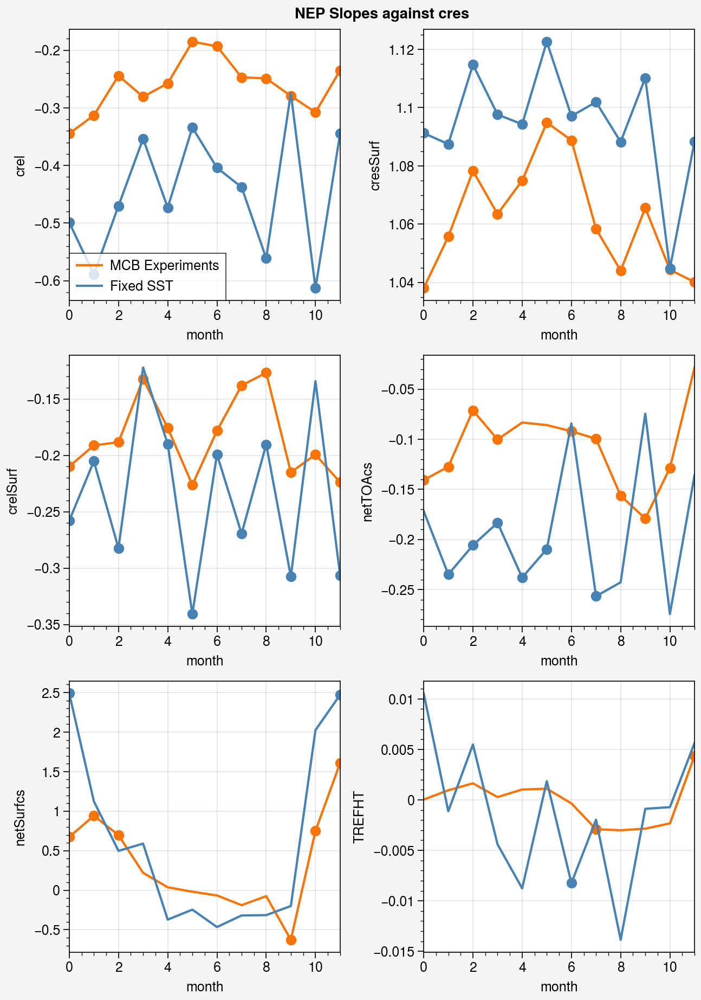

In [30]:
fig,ax = plt.subplots(ncols = 2,nrows = 3,share=False)
fig.format(suptitle = 'NEP Slopes against cres')
for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT']):
    ax[i].plot(DS_MCB[var][0][:,0],label = 'MCB Experiments',color='orange')
    ax[i].plot([m for m in range(12) if DS_MCB[var][0][m,3] < 0.05],
               [DS_MCB[var][0][m,0] for m in range(12) if DS_MCB[var][0][m,3] < 0.05],
               'o',color='orange')
    ax[i].plot(DS_FSST[var][0][:,0],label = 'Fixed SST',color='steelblue')
    ax[i].plot([m for m in range(12) if DS_FSST[var][0][m,3] < 0.05],
               [DS_FSST[var][0][m,0] for m in range(12) if DS_FSST[var][0][m,3] < 0.05],
               'o',color='steelblue')

ax[0].legend(ncol=1)

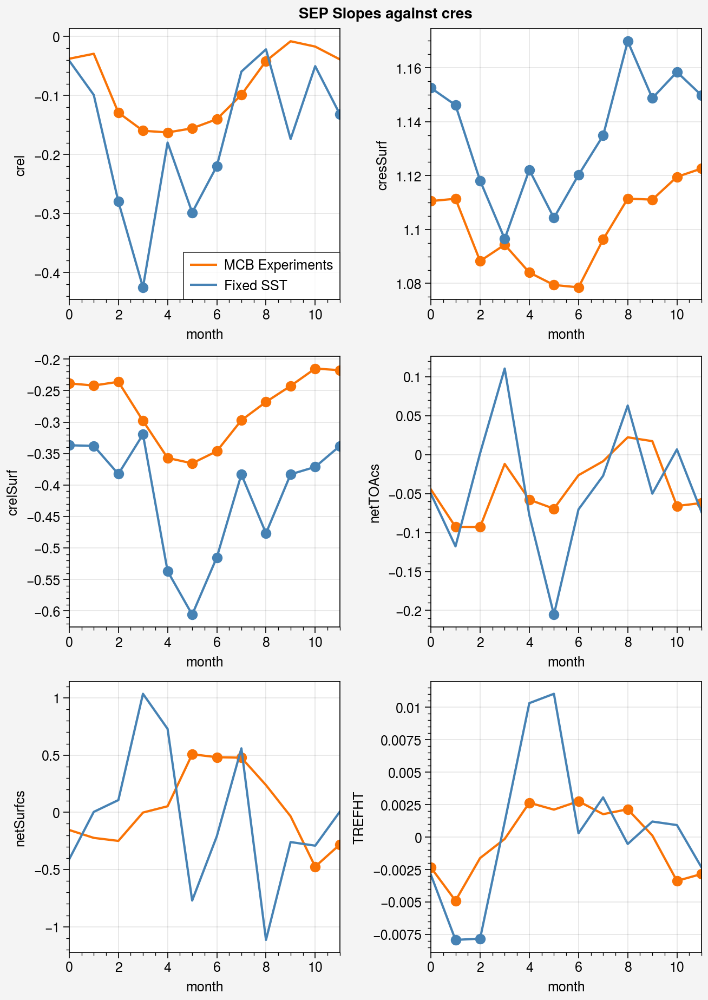

In [31]:
fig,ax = plt.subplots(ncols = 2,nrows = 3,share=False)
fig.format(suptitle = 'SEP Slopes against cres')
for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs','TREFHT']):
    ax[i].plot(DS_MCB[var][1][:,0],label = 'MCB Experiments',color='orange')
    ax[i].plot([m for m in range(12) if DS_MCB[var][1][m,3] < 0.05],
               [DS_MCB[var][1][m,0] for m in range(12) if DS_MCB[var][1][m,3] < 0.05],
               'o',color='orange')
    ax[i].plot(DS_FSST[var][1][:,0],label = 'Fixed SST',color='steelblue')
    ax[i].plot([m for m in range(12) if DS_FSST[var][1][m,3] < 0.05],
               [DS_FSST[var][1][m,0] for m in range(12) if DS_FSST[var][1][m,3] < 0.05],
               'o',color='steelblue')

ax[0].legend(ncol=1)

In [39]:
indata = xr.open_dataset(path + 'CESM2.historical.r1i1p1f1.Input.Exp8_fixed.nc')
regmeans_cpl = {}
regmeans_cpl['NEP'] = {exp:indata.where((lat > 0) & (lat < 30) & 
                                          (lon > 360-150)&(lon < 360-110),
                                          drop=True).mean(('lon','lat')) for exp in ['historical']}
regmeans_cpl['SEP'] = {exp:indata.where((lat > -30) & (lat < 0) & 
                                          (lon > 360-110) & (lon < 360-70),
                                          drop=True).mean(('lon','lat')) for exp in ['historical']}
regmeans_cpl['SEA'] = {exp:indata.where((lat > -30) & (lat < 0) & 
                                          ((lon > 360-15) | (lon < 25)),
                                          drop=True).mean(('lon','lat')) for exp in ['historical']}

In [46]:
## Fixed_SST regressions
regress_cpl = {}

exp = 'historical'
for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs']):
        regress_cpl[var] = []
        for j,reg in enumerate(['NEP','SEP','SEA']):
            print(var,reg)
            regress_cpl[var].append([])
            for m in range(12):
                d_cres = regmeans_cpl[reg][exp]['cres'][m::12].values
                d_var = regmeans_cpl[reg][exp][var][m::12].values
                regress_cpl[var][j].append(np.array(scipy.stats.linregress(d_cres,d_var)))


crel NEP
crel SEP
crel SEA
cresSurf NEP
cresSurf SEP
cresSurf SEA
crelSurf NEP
crelSurf SEP
crelSurf SEA
netTOAcs NEP
netTOAcs SEP
netTOAcs SEA
netSurfcs NEP
netSurfcs SEP
netSurfcs SEA


In [47]:
DS = xr.Dataset({var:(('region','month','polynomial_term'),regress_cpl[var]) for var in regress_cpl},
          coords = {'region':('region',['NEP','SEP','SEA']),
                   'month':('month',range(12)),
                   'polynomial_term':('polynomial_term',['slope','intercept','rvalue','pvalue','stderr'])
                   })
DS.to_netcdf('/home/jupyter-haruki/work/CESM2_crescorr_historical_cpl.nc')

In [49]:
DS_MCB = xr.open_dataset('/home/jupyter-haruki/work/CESM2_crescorr_MCB_EXP.nc')
DS_FSST = xr.open_dataset('/home/jupyter-haruki/work/CESM2_crescorr_Fixed_SST.nc')
DS_CPL = xr.open_dataset('/home/jupyter-haruki/work/CESM2_crescorr_historical_cpl.nc')

<xarray.Dataset>
Dimensions:    (time: 120, nbnd: 2)
Coordinates:
  * time       (time) float64 31.0 59.0 90.0 ... 3.589e+03 3.619e+03 3.65e+03
Dimensions without coordinates: nbnd
Data variables:
    time_bnds  (time, nbnd) float64 dask.array<chunksize=(120, 2), meta=np.ndarray>
    PRECC      (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    PRECL      (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    PSL        (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    TREFHT     (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    crel       (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    crelSurf   (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    cres       (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    cresSurf   (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    netSurfcs  (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>
    netTOAcs   (time) float32 dask.array<chunksize=(120,), meta=np.ndarray>

In [68]:
(np.mean(regmeans['NEP']['MCB_R1R2R3_CN375cm']['crel'][m::12].values) - 
 np.mean(regmeans['NEP']['Fixed_SST']['crel'][m::12].values))

0.49816132

In [89]:
## Fixed_SST regressions
regress_forc = {}

exp = 'historical'
for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs']):
        regress_forc[var] = []
        for j,reg in enumerate(['NEP','SEP','SEA']):
            print(var,reg)
            regress_forc[var].append([])
            for m in range(12):
                d_cres = [np.mean(regmeans[reg][exp]['cres'][m::12].values) - \
                        np.mean(regmeans[reg]['Fixed_SST']['cres'][m::12].values) 
                          for exp in regmeans['NEP'] if not exp == 'Fixed_SST' and not exp == 'MCB_R1R2R3_CN775cm']
                d_var = [np.mean(regmeans[reg][exp][var][m::12].values) - \
                        np.mean(regmeans[reg]['Fixed_SST'][var][m::12].values) 
                          for exp in regmeans['NEP'] if not exp == 'Fixed_SST' and not exp == 'MCB_R1R2R3_CN775cm']
                regress_forc[var][j].append(np.array(scipy.stats.linregress(d_cres,d_var)))


crel NEP
crel SEP
crel SEA
cresSurf NEP
cresSurf SEP
cresSurf SEA
crelSurf NEP
crelSurf SEP
crelSurf SEA
netTOAcs NEP
netTOAcs SEP
netTOAcs SEA
netSurfcs NEP
netSurfcs SEP
netSurfcs SEA


In [87]:
np.array(regress_forc['crel'][0])[:,0]

array([-0.25455281, -0.34952186, -0.25060415, -0.13492696, -0.08844447,
       -0.02711199, -0.01404908, -0.23870462, -0.18876832, -0.27441628,
       -0.16067362, -0.07875715])

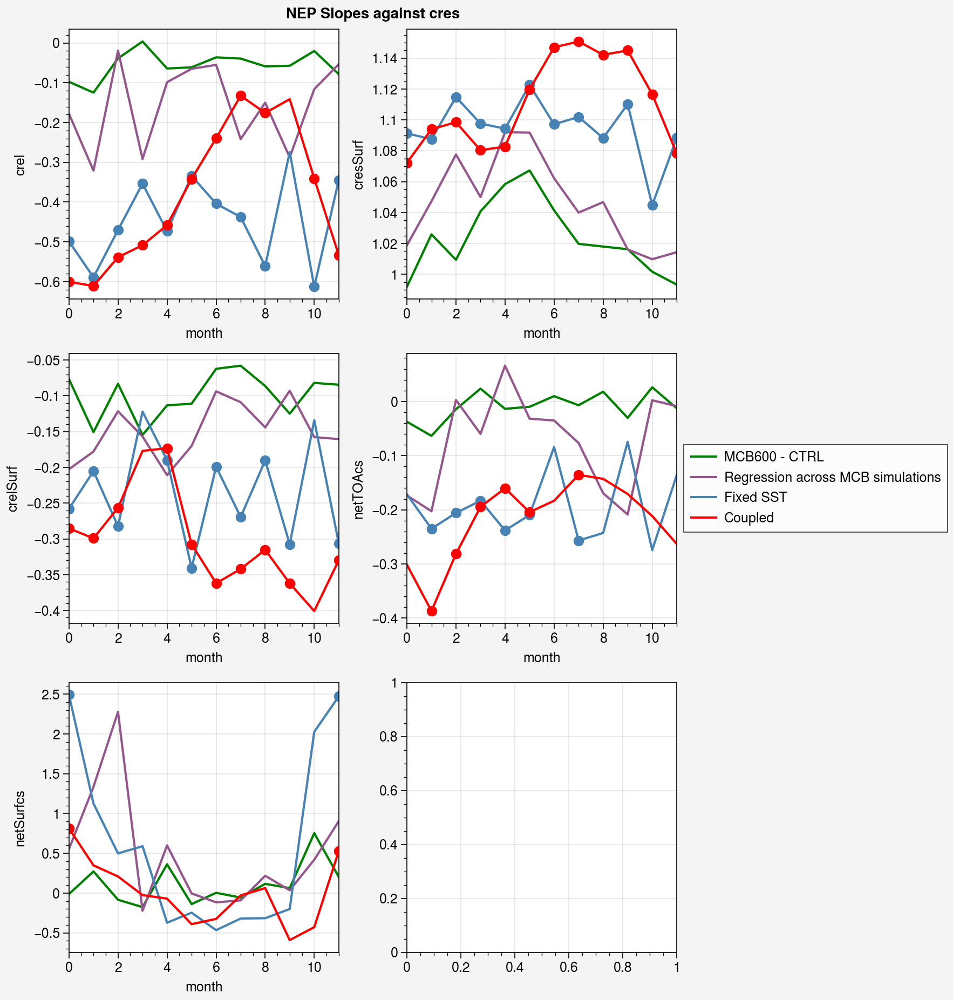

In [92]:
fig,ax = plt.subplots(ncols = 2,nrows = 3,share=False)
fig.format(suptitle = 'NEP Slopes against cres')
for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs']):
    #ax[i].plot(DS_MCB[var][0][:,0],label = 'MCB Experiments',color='orange')
    #ax[i].plot([m for m in range(12) if DS_MCB[var][0][m,3] < 0.05],
    #           [DS_MCB[var][0][m,0] for m in range(12) if DS_MCB[var][0][m,3] < 0.05],
    #           'o',color='orange')
    #ax[i].plot([(np.mean(regmeans['NEP']['MCB_R1R2R3_CN375cm'][var][m::12].values) - 
    #            np.mean(regmeans['NEP']['Fixed_SST'][var][m::12].values))/\
    #            (np.mean(regmeans['NEP']['MCB_R1R2R3_CN375cm']['cres'][m::12].values) - 
    #            np.mean(regmeans['NEP']['Fixed_SST']['cres'][m::12].values)) for m in range(12)],
    #           color='orange',label = 'MCB375 - CTRL')
    ax[i].plot([(np.mean(regmeans['NEP']['MCB_R1R2R3_CN600cm'][var][m::12].values) - 
                np.mean(regmeans['NEP']['Fixed_SST'][var][m::12].values))/\
                (np.mean(regmeans['NEP']['MCB_R1R2R3_CN600cm']['cres'][m::12].values) - 
                np.mean(regmeans['NEP']['Fixed_SST']['cres'][m::12].values)) for m in range(12)],
               color='green',label = 'MCB600 - CTRL')
    ax[i].plot(np.array(regress_forc[var][0])[:,0],label = 'Regression across MCB simulations',color='purple')

    ax[i].plot(DS_FSST[var][0][:,0],label = 'Fixed SST',color='steelblue')
    ax[i].plot([m for m in range(12) if DS_FSST[var][0][m,3] < 0.05],
               [DS_FSST[var][0][m,0] for m in range(12) if DS_FSST[var][0][m,3] < 0.05],
               'o',color='steelblue')
    ax[i].plot(DS_CPL[var][0][:,0],label = 'Coupled',color='red')
    ax[i].plot([m for m in range(12) if DS_FSST[var][0][m,3] < 0.05],
               [DS_CPL[var][0][m,0] for m in range(12) if DS_FSST[var][0][m,3] < 0.05],
               'o',color='red')

ax[3].legend(ncol=1,loc='r')

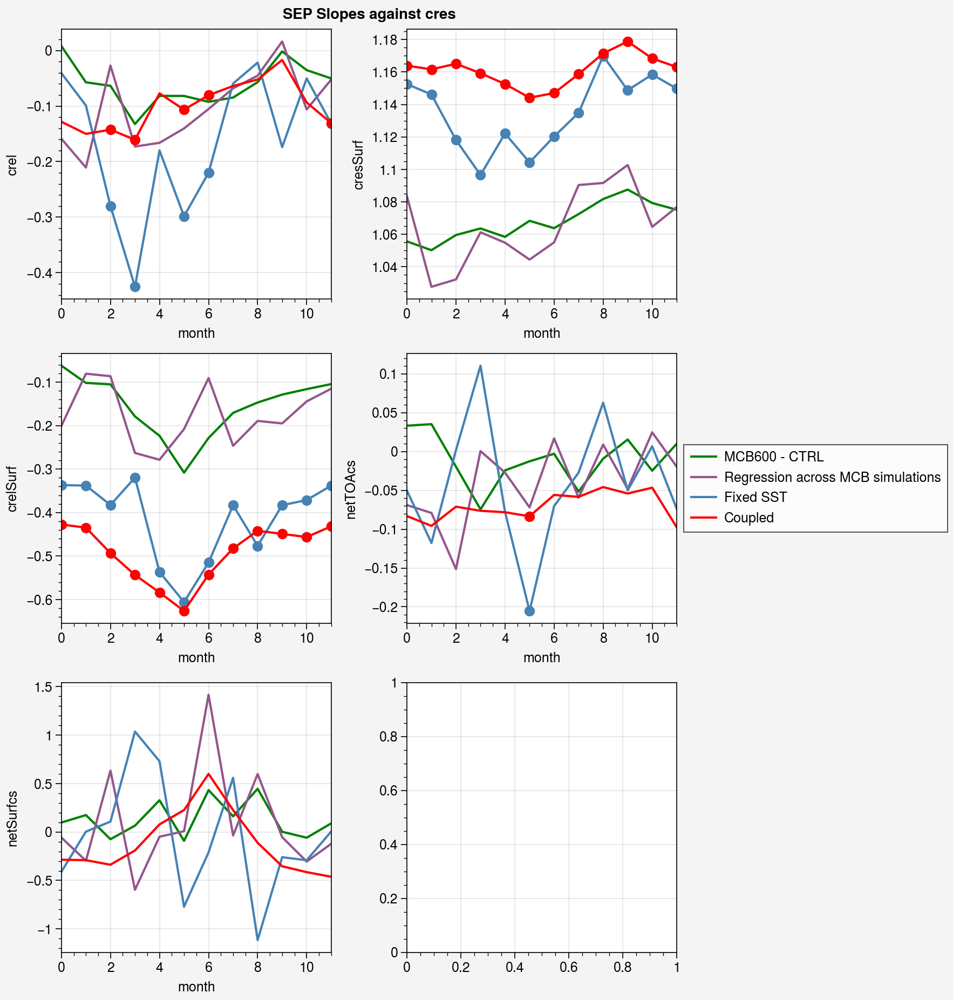

In [93]:
fig,ax = plt.subplots(ncols = 2,nrows = 3,share=False)
fig.format(suptitle = 'SEP Slopes against cres')
for i,var in enumerate(['crel','cresSurf','crelSurf','netTOAcs','netSurfcs']):
    #ax[i].plot(DS_MCB[var][1][:,0],label = 'MCB Experiments',color='orange')
    #ax[i].plot([m for m in range(12) if DS_MCB[var][1][m,3] < 0.05],
    #           [DS_MCB[var][1][m,0] for m in range(12) if DS_MCB[var][1][m,3] < 0.05],
    #           'o',color='orange')
    #ax[i].plot([(np.mean(regmeans['SEP']['MCB_R1R2R3_CN375cm'][var][m::12].values) - 
    #            np.mean(regmeans['SEP']['Fixed_SST'][var][m::12].values))/\
    #            (np.mean(regmeans['SEP']['MCB_R1R2R3_CN375cm']['cres'][m::12].values) - 
    #            np.mean(regmeans['SEP']['Fixed_SST']['cres'][m::12].values)) for m in range(12)],
    #           color='orange',label = 'MCB375 - CTRL')
    ax[i].plot([(np.mean(regmeans['SEP']['MCB_R1R2R3_CN600cm'][var][m::12].values) - 
                np.mean(regmeans['SEP']['Fixed_SST'][var][m::12].values))/\
                (np.mean(regmeans['SEP']['MCB_R1R2R3_CN600cm']['cres'][m::12].values) - 
                np.mean(regmeans['SEP']['Fixed_SST']['cres'][m::12].values)) for m in range(12)],
               color='green',label = 'MCB600 - CTRL')
    ax[i].plot(np.array(regress_forc[var][1])[:,0],label = 'Regression across MCB simulations',color='purple')

    ax[i].plot(DS_FSST[var][1][:,0],label = 'Fixed SST',color='steelblue')
    ax[i].plot([m for m in range(12) if DS_FSST[var][1][m,3] < 0.05],
               [DS_FSST[var][1][m,0] for m in range(12) if DS_FSST[var][1][m,3] < 0.05],
               'o',color='steelblue')
    ax[i].plot(DS_CPL[var][1][:,0],label = 'Coupled',color='red')
    ax[i].plot([m for m in range(12) if DS_FSST[var][1][m,3] < 0.05],
               [DS_CPL[var][1][m,0] for m in range(12) if DS_FSST[var][1][m,3] < 0.05],
               'o',color='red')

ax[3].legend(ncol=1,loc='r')